In [110]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from scipy.ndimage.measurements import label
import pdb

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [111]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [112]:
# HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

In [120]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, classifier, X_scaler, orient, pix_per_cell, cell_per_block):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = img_tosearch #convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 4  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    boxes = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            #pdb.set_trace()
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Scale features and make a prediction
            test_features = X_scaler.transform(hog_features.reshape(1, -1))
            test_prediction = classifier.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    return draw_img, boxes
    

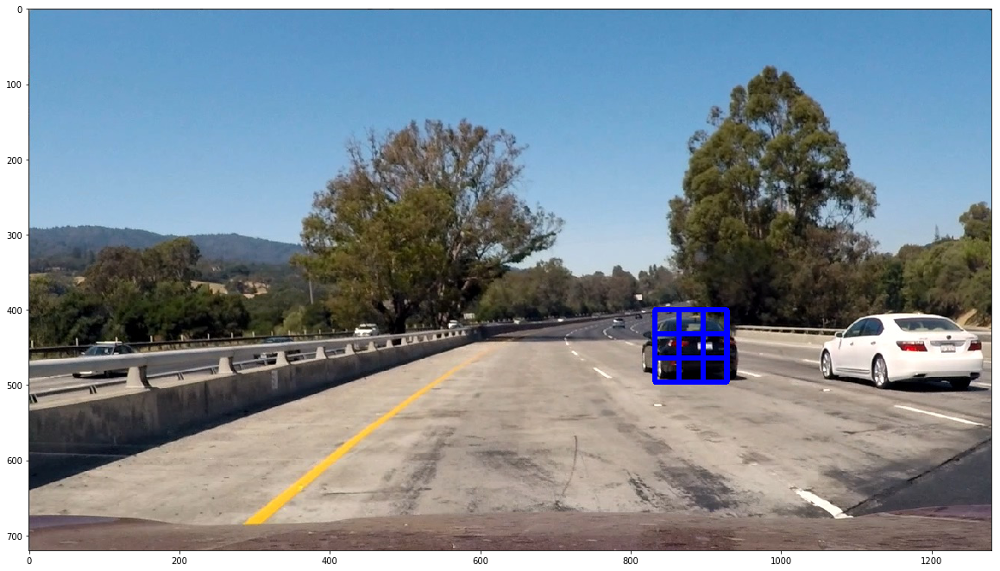

In [123]:
ystart = 400
ystop = 656
scale = 1

img = mpimg.imread('./test_images/test1.jpg')
#plt.figure(figsize=(20,20))
#plt.imshow(img)

# load Xgboost classifier model from file
xgboost_model, X_scaler = pickle.load(open("xgboost_classifier.pkl", "rb"))

out_img, boxes = find_cars(img, ystart, ystop, scale, xgboost_model, X_scaler, orient, pix_per_cell, cell_per_block)

plt.figure(figsize=(20,20))
plt.imshow(out_img)

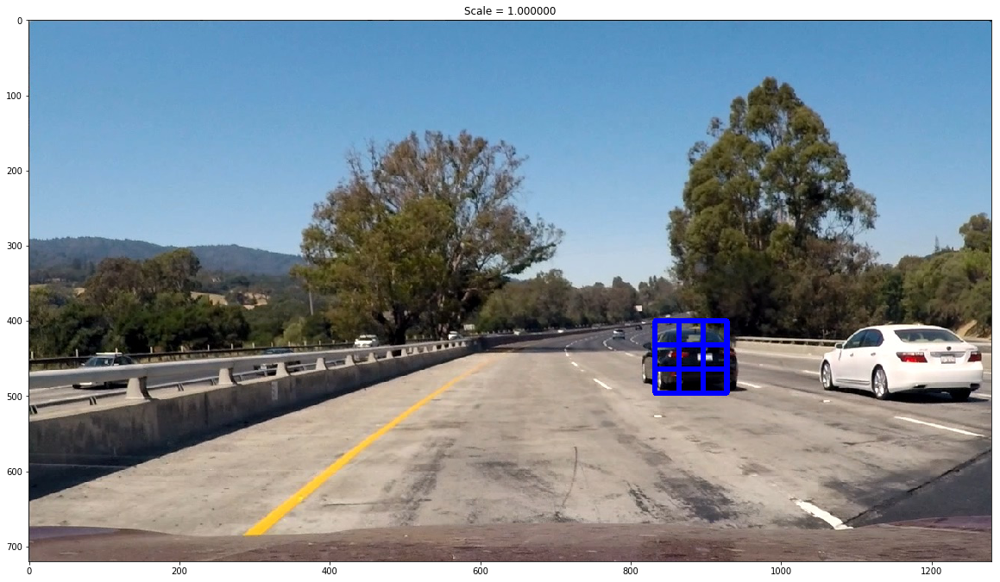

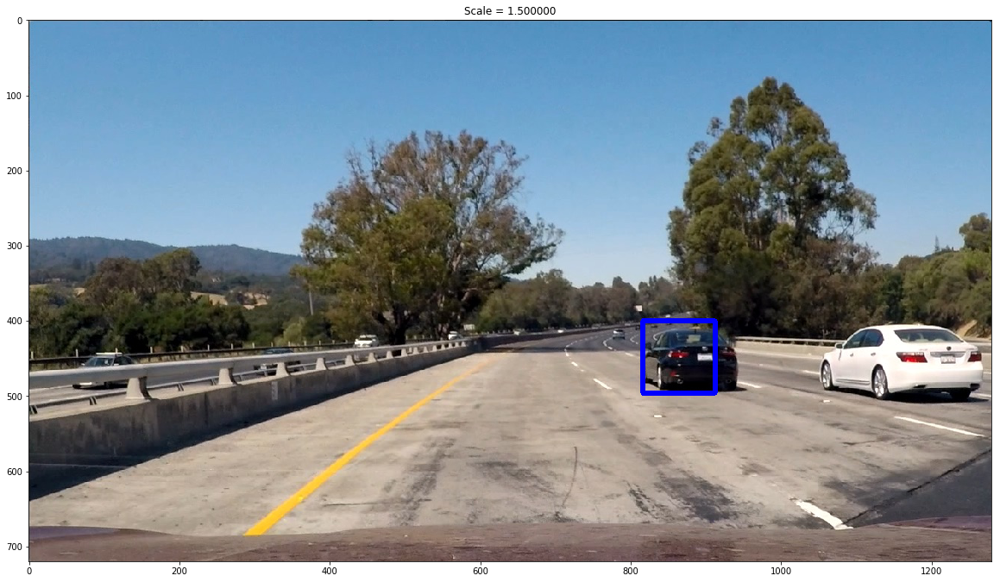

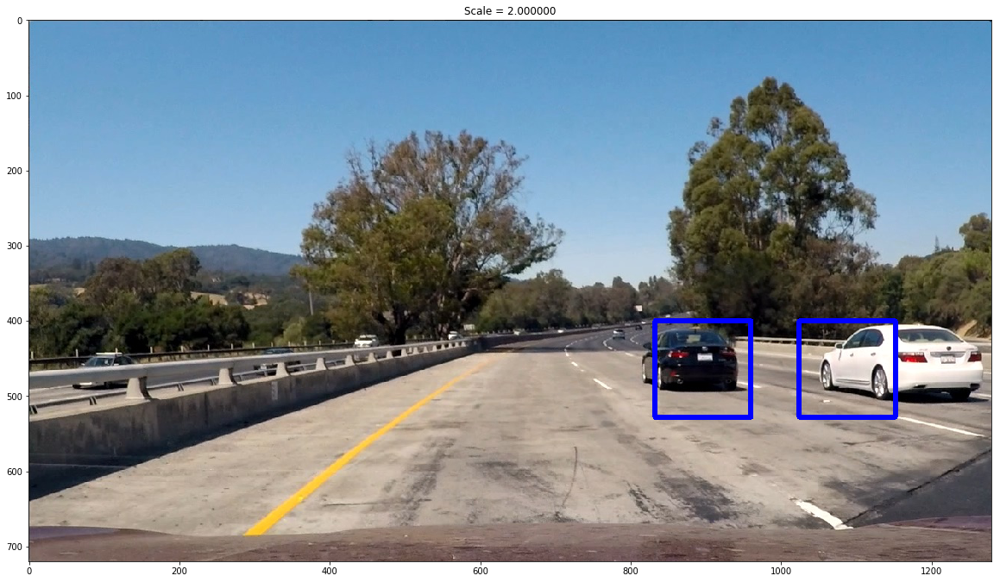

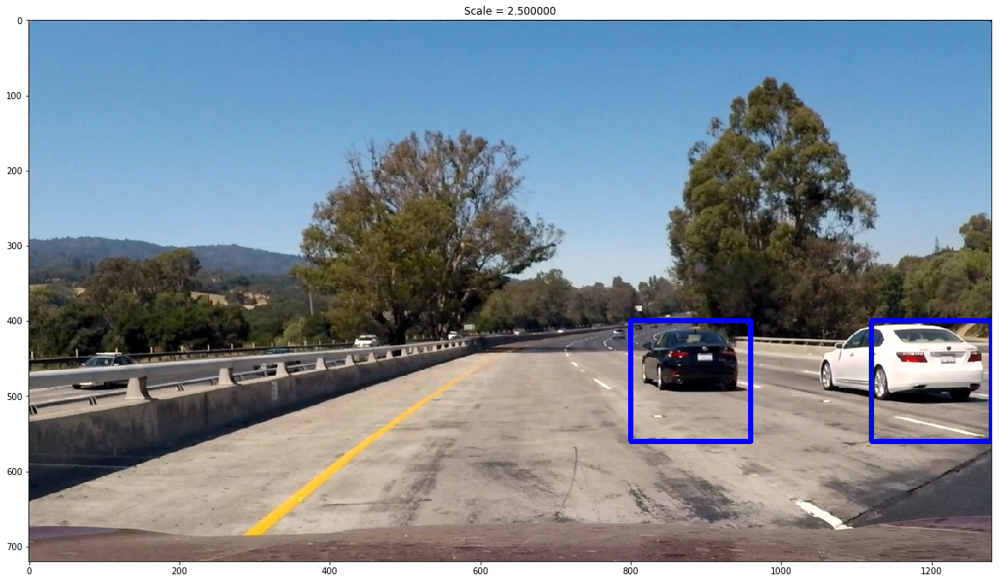

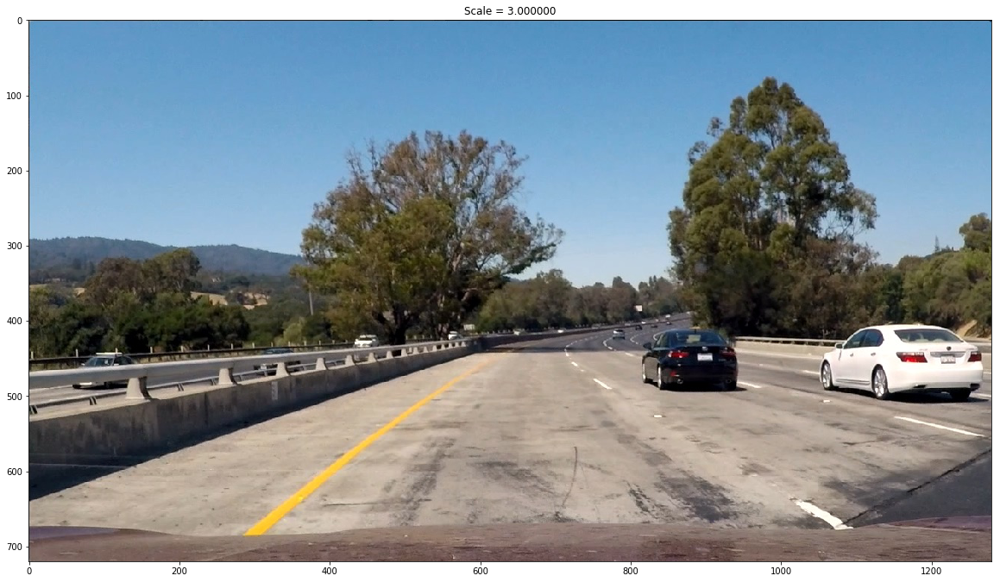

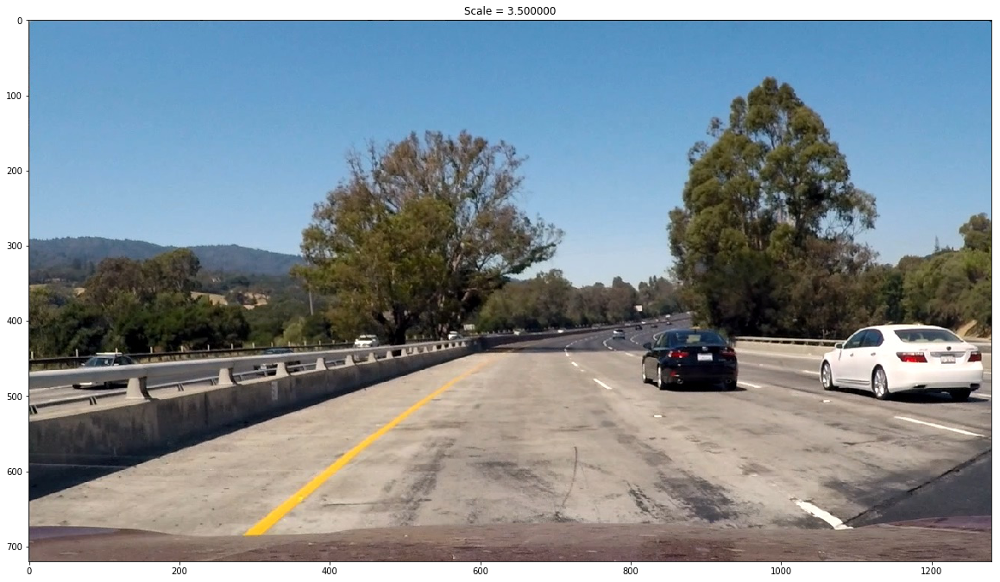

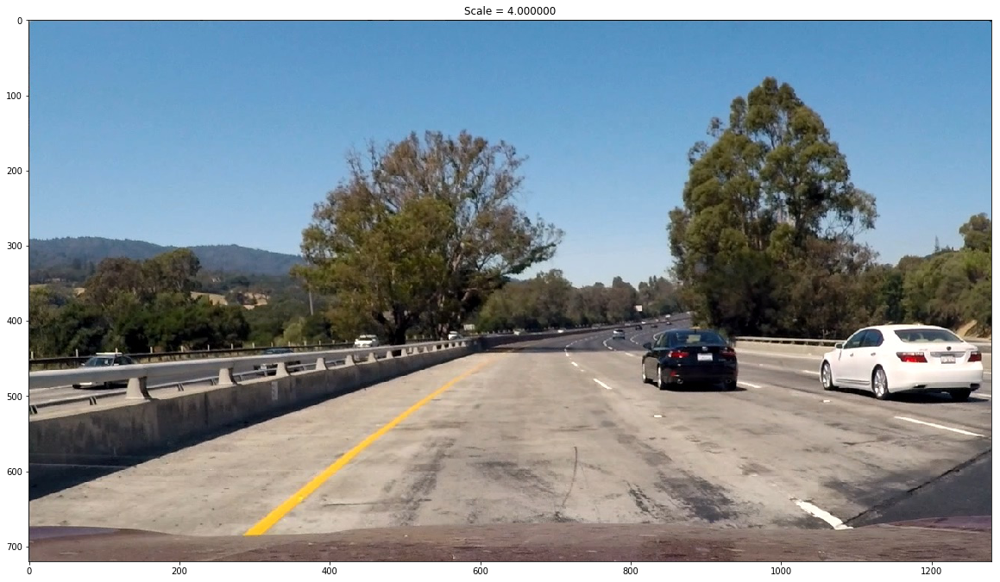

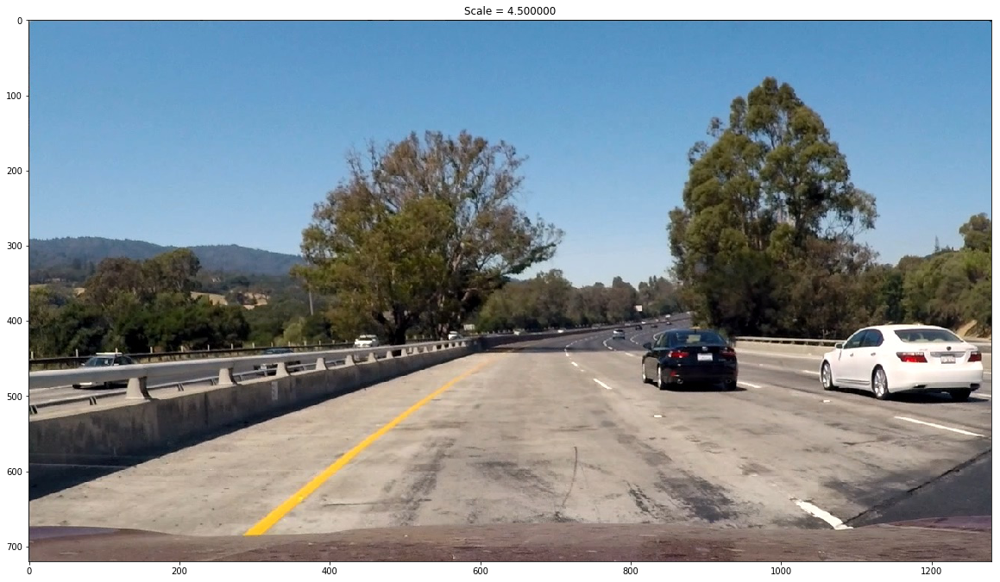

In [130]:
ystart = 400
ystop = 656

boxes = []
for scale in  np.arange(1, 5, 0.5):    
    out_img, box = find_cars(img, ystart, ystop, scale, xgboost_model, X_scaler, orient, pix_per_cell, cell_per_block)
    boxes.extend(box)
    plt.figure(figsize=(20,20))
    plt.title('Scale = %f'%scale)
    plt.imshow(out_img)

In [131]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        font = cv2.FONT_HERSHEY_SIMPLEX
        #cv2.putText(img,'%d'%car_number,bbox[0], font, 4,(255,255,255),2,cv2.LINE_AA)
    # Return the image
    return img

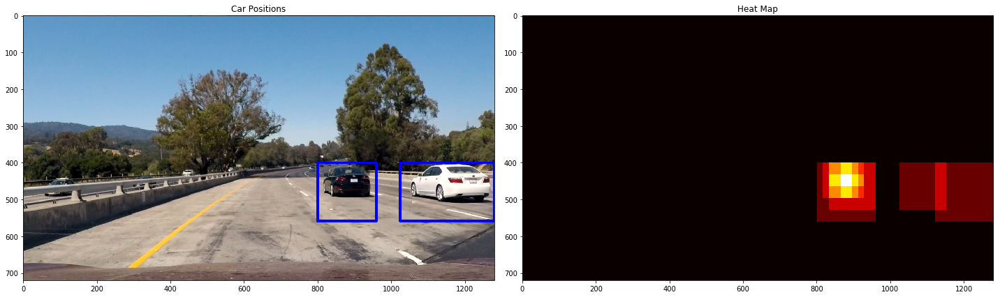

In [132]:
heat = np.zeros_like(img[:,:,0]).astype(np.float)
# Add heat to each box in box list
heat = add_heat(heat,boxes)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,0)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(img), labels)

fig = plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()

In [134]:
def car_detection_pipeline(img, xgboost_model, X_scaler, orient, pix_per_cell, cell_per_block):
    ystart = 400
    ystop = 656

    boxes = []
    for scale in  np.arange(1, 5, 0.5):    
        out_img, box = find_cars(img, ystart, ystop, scale, xgboost_model, X_scaler, orient, pix_per_cell, cell_per_block)
        boxes.extend(box)

    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,boxes)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,0)

    # Visualize the heatmap when displaying    
    heatmap = heat*255/np.max(heat)
    heatmap = np.clip(heatmap, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    heatmap = np.dstack((heatmap, heatmap, heatmap))

    result = np.hstack((draw_img, heatmap))
    return result.astype(np.int32)

In [135]:
result = car_detection_pipeline(img, xgboost_model, X_scaler, orient, pix_per_cell, cell_per_block)

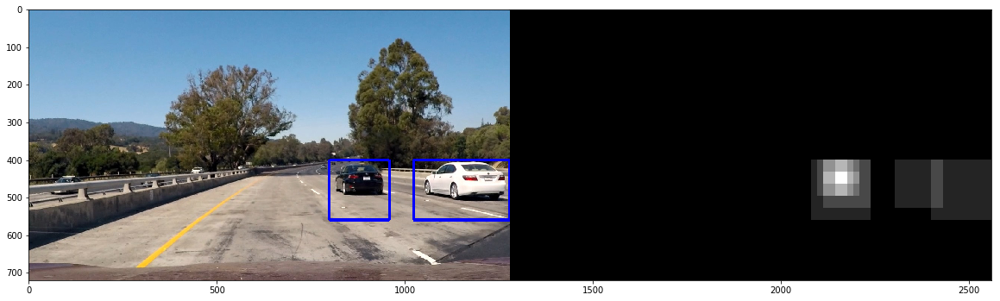

In [136]:
plt.figure(figsize=(20,20))
plt.imshow(result)

# Apply pipeline on video

In [137]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

white_output = './project_video_proccessed.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("./project_video.mp4")
white_clip = clip1.fl_image(lambda img: car_detection_pipeline(img, xgboost_model, X_scaler, orient, pix_per_cell, cell_per_block)) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ./project_video_proccessed.mp4
[MoviePy] Writing video ./project_video_proccessed.mp4




  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:04<1:42:50,  4.90s/it]

  0%|          | 2/1261 [00:09<1:43:53,  4.95s/it]

  0%|          | 3/1261 [00:15<1:45:24,  5.03s/it]

  0%|          | 4/1261 [00:20<1:45:29,  5.04s/it]

  0%|          | 5/1261 [00:25<1:46:09,  5.07s/it]

  0%|          | 6/1261 [00:30<1:45:56,  5.07s/it]

  1%|          | 7/1261 [00:35<1:46:24,  5.09s/it]

  1%|          | 8/1261 [00:40<1:46:46,  5.11s/it]

  1%|          | 9/1261 [00:45<1:46:36,  5.11s/it]

  1%|          | 10/1261 [00:50<1:46:02,  5.09s/it]

  1%|          | 11/1261 [00:55<1:45:53,  5.08s/it]

  1%|          | 12/1261 [01:00<1:45:35,  5.07s/it]

  1%|          | 13/1261 [01:05<1:45:01,  5.05s/it]

  1%|          | 14/1261 [01:10<1:44:52,  5.05s/it]

  1%|          | 15/1261 [01:15<1:44:57,  5.05s/it]

  1%|▏         | 16/1261 [01:21<1:45:06,  5.07s/it]

  1%|▏         | 17/1261 [01:26<1:45:06,  5.07s/it]

  1%|▏         | 18/1261 [01:31<1:45:04,  5.07s/it]

  2%|▏     

 11%|█         | 138/1261 [10:23<1:24:34,  4.52s/it]

 11%|█         | 139/1261 [10:27<1:24:23,  4.51s/it]

 11%|█         | 140/1261 [10:30<1:24:11,  4.51s/it]

 11%|█         | 141/1261 [10:34<1:24:01,  4.50s/it]

 11%|█▏        | 142/1261 [10:38<1:23:51,  4.50s/it]

 11%|█▏        | 143/1261 [10:42<1:23:42,  4.49s/it]

 11%|█▏        | 144/1261 [10:46<1:23:34,  4.49s/it]

 11%|█▏        | 145/1261 [10:50<1:23:26,  4.49s/it]

 12%|█▏        | 146/1261 [10:54<1:23:15,  4.48s/it]

 12%|█▏        | 147/1261 [10:57<1:22:59,  4.47s/it]

 12%|█▏        | 148/1261 [11:00<1:22:44,  4.46s/it]

 12%|█▏        | 149/1261 [11:03<1:22:33,  4.45s/it]

 12%|█▏        | 150/1261 [11:07<1:22:24,  4.45s/it]

 12%|█▏        | 151/1261 [11:11<1:22:17,  4.45s/it]

 12%|█▏        | 152/1261 [11:15<1:22:10,  4.45s/it]

 12%|█▏        | 153/1261 [11:19<1:22:04,  4.44s/it]

 12%|█▏        | 154/1261 [11:23<1:21:54,  4.44s/it]

 12%|█▏        | 155/1261 [11:27<1:21:45,  4.44s/it]

 12%|█▏        | 156/1261 [1

 22%|██▏       | 274/1261 [17:30<1:03:03,  3.83s/it]

 22%|██▏       | 275/1261 [17:33<1:02:55,  3.83s/it]

 22%|██▏       | 276/1261 [17:36<1:02:48,  3.83s/it]

 22%|██▏       | 277/1261 [17:39<1:02:42,  3.82s/it]

 22%|██▏       | 278/1261 [17:42<1:02:36,  3.82s/it]

 22%|██▏       | 279/1261 [17:45<1:02:28,  3.82s/it]

 22%|██▏       | 280/1261 [17:48<1:02:21,  3.81s/it]

 22%|██▏       | 281/1261 [17:51<1:02:16,  3.81s/it]

 22%|██▏       | 282/1261 [17:54<1:02:10,  3.81s/it]

 22%|██▏       | 283/1261 [17:57<1:02:03,  3.81s/it]

 23%|██▎       | 284/1261 [18:00<1:01:56,  3.80s/it]

 23%|██▎       | 285/1261 [18:02<1:01:48,  3.80s/it]

 23%|██▎       | 286/1261 [18:06<1:01:42,  3.80s/it]

 23%|██▎       | 287/1261 [18:09<1:01:35,  3.79s/it]

 23%|██▎       | 288/1261 [18:11<1:01:29,  3.79s/it]

 23%|██▎       | 289/1261 [18:14<1:01:22,  3.79s/it]

 23%|██▎       | 290/1261 [18:17<1:01:16,  3.79s/it]

 23%|██▎       | 291/1261 [18:20<1:01:09,  3.78s/it]

 23%|██▎       | 292/1261 [1

 33%|███▎      | 414/1261 [25:16<51:41,  3.66s/it]

 33%|███▎      | 415/1261 [25:19<51:37,  3.66s/it]

 33%|███▎      | 416/1261 [25:22<51:32,  3.66s/it]

 33%|███▎      | 417/1261 [25:25<51:26,  3.66s/it]

 33%|███▎      | 418/1261 [25:27<51:21,  3.66s/it]

 33%|███▎      | 419/1261 [25:30<51:16,  3.65s/it]

 33%|███▎      | 420/1261 [25:33<51:11,  3.65s/it]

 33%|███▎      | 421/1261 [25:36<51:06,  3.65s/it]

 33%|███▎      | 422/1261 [25:39<51:01,  3.65s/it]

 34%|███▎      | 423/1261 [25:42<50:56,  3.65s/it]

 34%|███▎      | 424/1261 [25:45<50:51,  3.65s/it]

 34%|███▎      | 425/1261 [25:49<50:46,  3.64s/it]

 34%|███▍      | 426/1261 [25:52<50:42,  3.64s/it]

 34%|███▍      | 427/1261 [25:54<50:36,  3.64s/it]

 34%|███▍      | 428/1261 [25:57<50:31,  3.64s/it]

 34%|███▍      | 429/1261 [26:00<50:27,  3.64s/it]

 34%|███▍      | 430/1261 [26:03<50:22,  3.64s/it]

 34%|███▍      | 431/1261 [26:07<50:17,  3.64s/it]

 34%|███▍      | 432/1261 [26:09<50:12,  3.63s/it]

 34%|███▍   

 44%|████▍     | 555/1261 [32:21<41:09,  3.50s/it]

 44%|████▍     | 556/1261 [32:24<41:05,  3.50s/it]

 44%|████▍     | 557/1261 [32:28<41:02,  3.50s/it]

 44%|████▍     | 558/1261 [32:31<40:58,  3.50s/it]

 44%|████▍     | 559/1261 [32:35<40:55,  3.50s/it]

 44%|████▍     | 560/1261 [32:38<40:51,  3.50s/it]

 44%|████▍     | 561/1261 [32:41<40:47,  3.50s/it]

 45%|████▍     | 562/1261 [32:44<40:43,  3.50s/it]

 45%|████▍     | 563/1261 [32:47<40:39,  3.50s/it]

 45%|████▍     | 564/1261 [32:50<40:35,  3.49s/it]

 45%|████▍     | 565/1261 [32:53<40:31,  3.49s/it]

 45%|████▍     | 566/1261 [32:56<40:27,  3.49s/it]

 45%|████▍     | 567/1261 [32:59<40:23,  3.49s/it]

 45%|████▌     | 568/1261 [33:03<40:19,  3.49s/it]

 45%|████▌     | 569/1261 [33:06<40:15,  3.49s/it]

 45%|████▌     | 570/1261 [33:08<40:11,  3.49s/it]

 45%|████▌     | 571/1261 [33:12<40:07,  3.49s/it]

 45%|████▌     | 572/1261 [33:15<40:03,  3.49s/it]

 45%|████▌     | 573/1261 [33:18<39:59,  3.49s/it]

 46%|████▌  

 55%|█████▌    | 696/1261 [39:30<32:04,  3.41s/it]

 55%|█████▌    | 697/1261 [39:34<32:01,  3.41s/it]

 55%|█████▌    | 698/1261 [39:37<31:57,  3.41s/it]

 55%|█████▌    | 699/1261 [39:40<31:53,  3.41s/it]

 56%|█████▌    | 700/1261 [39:43<31:50,  3.40s/it]

 56%|█████▌    | 701/1261 [39:46<31:46,  3.40s/it]

 56%|█████▌    | 702/1261 [39:49<31:42,  3.40s/it]

 56%|█████▌    | 703/1261 [39:52<31:38,  3.40s/it]

 56%|█████▌    | 704/1261 [39:55<31:35,  3.40s/it]

 56%|█████▌    | 705/1261 [39:58<31:31,  3.40s/it]

 56%|█████▌    | 706/1261 [40:01<31:27,  3.40s/it]

 56%|█████▌    | 707/1261 [40:04<31:23,  3.40s/it]

 56%|█████▌    | 708/1261 [40:07<31:20,  3.40s/it]

 56%|█████▌    | 709/1261 [40:09<31:16,  3.40s/it]

 56%|█████▋    | 710/1261 [40:13<31:12,  3.40s/it]

 56%|█████▋    | 711/1261 [40:16<31:09,  3.40s/it]

 56%|█████▋    | 712/1261 [40:19<31:05,  3.40s/it]

 57%|█████▋    | 713/1261 [40:22<31:01,  3.40s/it]

 57%|█████▋    | 714/1261 [40:25<30:57,  3.40s/it]

 57%|█████▋ 

 66%|██████▋   | 837/1261 [47:21<23:59,  3.40s/it]

 66%|██████▋   | 838/1261 [47:25<23:56,  3.40s/it]

 67%|██████▋   | 839/1261 [47:28<23:52,  3.39s/it]

 67%|██████▋   | 840/1261 [47:31<23:49,  3.39s/it]

 67%|██████▋   | 841/1261 [47:34<23:45,  3.39s/it]

 67%|██████▋   | 842/1261 [47:37<23:41,  3.39s/it]

 67%|██████▋   | 843/1261 [47:40<23:38,  3.39s/it]

 67%|██████▋   | 844/1261 [47:43<23:34,  3.39s/it]

 67%|██████▋   | 845/1261 [47:46<23:31,  3.39s/it]

 67%|██████▋   | 846/1261 [47:49<23:27,  3.39s/it]

 67%|██████▋   | 847/1261 [47:52<23:23,  3.39s/it]

 67%|██████▋   | 848/1261 [47:55<23:20,  3.39s/it]

 67%|██████▋   | 849/1261 [47:58<23:16,  3.39s/it]

 67%|██████▋   | 850/1261 [48:01<23:13,  3.39s/it]

 67%|██████▋   | 851/1261 [48:04<23:09,  3.39s/it]

 68%|██████▊   | 852/1261 [48:07<23:06,  3.39s/it]

 68%|██████▊   | 853/1261 [48:10<23:02,  3.39s/it]

 68%|██████▊   | 854/1261 [48:13<22:59,  3.39s/it]

 68%|██████▊   | 855/1261 [48:17<22:55,  3.39s/it]

 68%|██████▊

 78%|███████▊  | 978/1261 [54:30<15:46,  3.34s/it]

 78%|███████▊  | 979/1261 [54:33<15:43,  3.34s/it]

 78%|███████▊  | 980/1261 [54:36<15:39,  3.34s/it]

 78%|███████▊  | 981/1261 [54:39<15:36,  3.34s/it]

 78%|███████▊  | 982/1261 [54:42<15:32,  3.34s/it]

 78%|███████▊  | 983/1261 [54:45<15:29,  3.34s/it]

 78%|███████▊  | 984/1261 [54:48<15:25,  3.34s/it]

 78%|███████▊  | 985/1261 [54:51<15:22,  3.34s/it]

 78%|███████▊  | 986/1261 [54:54<15:18,  3.34s/it]

 78%|███████▊  | 987/1261 [54:57<15:15,  3.34s/it]

 78%|███████▊  | 988/1261 [55:00<15:11,  3.34s/it]

 78%|███████▊  | 989/1261 [55:03<15:08,  3.34s/it]

 79%|███████▊  | 990/1261 [55:06<15:05,  3.34s/it]

 79%|███████▊  | 991/1261 [55:09<15:01,  3.34s/it]

 79%|███████▊  | 992/1261 [55:12<14:58,  3.34s/it]

 79%|███████▊  | 993/1261 [55:15<14:54,  3.34s/it]

 79%|███████▉  | 994/1261 [55:18<14:51,  3.34s/it]

 79%|███████▉  | 995/1261 [55:21<14:47,  3.34s/it]

 79%|███████▉  | 996/1261 [55:24<14:44,  3.34s/it]

 79%|███████

 89%|████████▊ | 1116/1261 [1:01:27<07:59,  3.30s/it]

 89%|████████▊ | 1117/1261 [1:01:30<07:55,  3.30s/it]

 89%|████████▊ | 1118/1261 [1:01:33<07:52,  3.30s/it]

 89%|████████▊ | 1119/1261 [1:01:36<07:49,  3.30s/it]

 89%|████████▉ | 1120/1261 [1:01:39<07:45,  3.30s/it]

 89%|████████▉ | 1121/1261 [1:01:42<07:42,  3.30s/it]

 89%|████████▉ | 1122/1261 [1:01:45<07:39,  3.30s/it]

 89%|████████▉ | 1123/1261 [1:01:48<07:35,  3.30s/it]

 89%|████████▉ | 1124/1261 [1:01:51<07:32,  3.30s/it]

 89%|████████▉ | 1125/1261 [1:01:54<07:29,  3.30s/it]

 89%|████████▉ | 1126/1261 [1:01:57<07:25,  3.30s/it]

 89%|████████▉ | 1127/1261 [1:02:00<07:22,  3.30s/it]

 89%|████████▉ | 1128/1261 [1:02:03<07:19,  3.30s/it]

 90%|████████▉ | 1129/1261 [1:02:07<07:15,  3.30s/it]

 90%|████████▉ | 1130/1261 [1:02:10<07:12,  3.30s/it]

 90%|████████▉ | 1131/1261 [1:02:13<07:09,  3.30s/it]

 90%|████████▉ | 1132/1261 [1:02:16<07:05,  3.30s/it]

 90%|████████▉ | 1133/1261 [1:02:19<07:02,  3.30s/it]

 90%|█████

 99%|█████████▉| 1250/1261 [1:08:59<00:36,  3.31s/it]

 99%|█████████▉| 1251/1261 [1:09:02<00:33,  3.31s/it]

 99%|█████████▉| 1252/1261 [1:09:05<00:29,  3.31s/it]

 99%|█████████▉| 1253/1261 [1:09:08<00:26,  3.31s/it]

 99%|█████████▉| 1254/1261 [1:09:11<00:23,  3.31s/it]

100%|█████████▉| 1255/1261 [1:09:14<00:19,  3.31s/it]

100%|█████████▉| 1256/1261 [1:09:17<00:16,  3.31s/it]

100%|█████████▉| 1257/1261 [1:09:20<00:13,  3.31s/it]

100%|█████████▉| 1258/1261 [1:09:23<00:09,  3.31s/it]

100%|█████████▉| 1259/1261 [1:09:26<00:06,  3.31s/it]

100%|█████████▉| 1260/1261 [1:09:29<00:03,  3.31s/it]



[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_proccessed.mp4 

CPU times: user 10h 48min 43s, sys: 3min 21s, total: 10h 52min 5s
Wall time: 1h 9min 30s


In [ ]:
from lane_detection import detect_lane

detect_car = lambda img: car_detection_pipeline(img, xgboost_model, X_scaler, orient, pix_per_cell, cell_per_block)
